<a href="https://colab.research.google.com/github/luisdamed/Gradient_Descent_Visualizations/blob/main/Advanced_Gradient_Descent_Trajectories.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Advanced Gradient Descent Visualizations
Comparing gradient-based optimization algorithms through animated figures.

I was inspired by the amazing [animations](https://imgur.com/a/Hqolp) shared by Alec Radford on a [Reddit comment](https://www.reddit.com/r/MachineLearning/comments/2gopfa/comment/cklhott/?utm_source=share&utm_medium=web2x&context=3).

This is my attemt to replicate them, while improving my Python skills and learning more about the optimizers used in Deep Learning.


This notebook is accompanied by these Medium Articles:
- [Creating a Gradient Descent Animation in Python](https://medium.com/towards-data-science/creating-a-gradient-descent-animation-in-python-3c4dcd20ca51)

In [26]:
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib.lines import Line2D
from IPython.display import Image


# Define function and it's gradient
In this case, I want to plot a saddle surface, defined by the following equation:
$$ f(x,y) = x^2 - y^2 $$

In [27]:
def f(theta):
  x = theta[0]
  y = theta[1]
  return x**2 - y**2
  # # return x**4 + 2*x**3 + y**2 - 1
  # return x**3 - 3*x*y**2

def grad_f(theta):
    returnValue = np.array([0.,0.])
    x = theta[0]
    y = theta[1]
    returnValue[0] += 2*x
    returnValue[1] += - 2*y
    # # returnValue[0] += 4*x**3 + 6*x**2
    # # returnValue[1] += 2*y
    # returnValue[0] += 3*x**2 - 3*y**2
    # returnValue[1] += -6*x*y
    return returnValue

# Plot the surface
First, we create a static image of the surface.

I had to play around with the parameters of `ax1.view_init(azim= 120, elev= 37)` to achieve the desired orientation.

This might be easier if you use an interactive backend for matplotlib figures.
In Colab, you can use `!pip install ipympl`
and then
```
%matplotlib widget
from google.colab import output
output.enable_custom_widget_manager()
```
At some point I used this, but then removed it from the Notebook and didn't bother looking at the revision history.


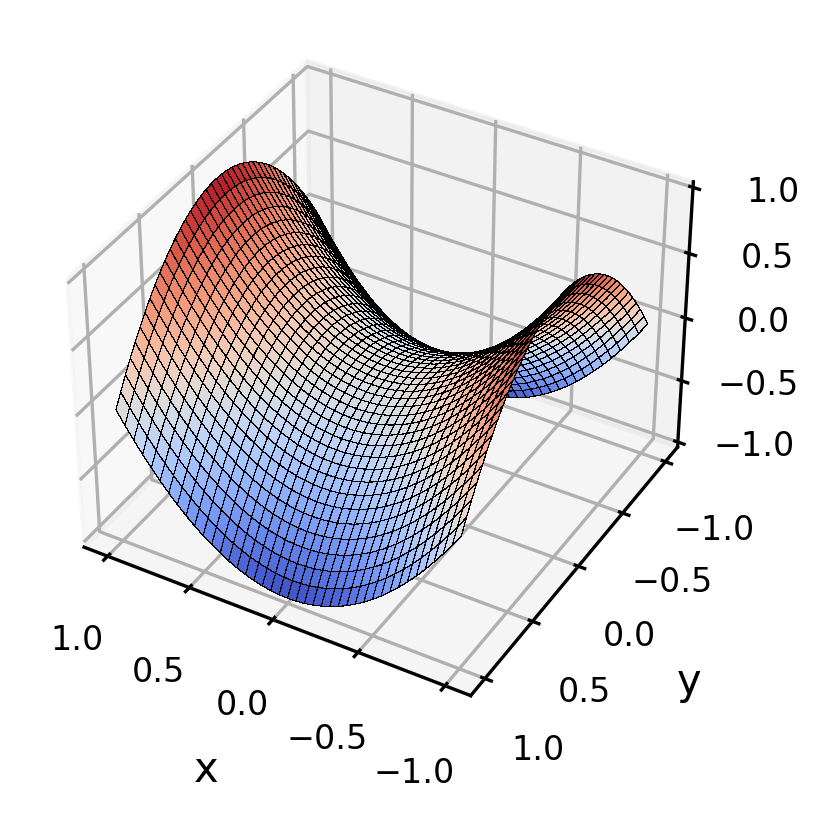

In [28]:
fig1 = plt.figure(figsize = (4,3), dpi = 300)
ax1 = fig1.add_subplot(111, projection='3d')

plot_args = {'rstride': 2, 'cstride': 2, 'cmap':"coolwarm",
             'linewidth': 0.01, 'antialiased': False,
             'vmin': -1, 'vmax': 1, 'edgecolors':'k'}

x, y = np.mgrid[-1:1:81j, -1:1:81j]

ax1.plot_surface(x, y, f([x,y]), **plot_args)
ax1.view_init(azim= 120, elev= 37)
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.tick_params(labelsize= 8)

## Define a function to compute gradient descent optimization

I've implemented the main algorithms I've found online, though they all have variants.
For reference, here are the sources for the most recent ones:

*   **ADAGRAD**: Duchi, J., Hazan, E., Singer, Y., “Adaptive Subgradient Methods for Online Learning and Stochastic Optimization**”.** *Journal of Machine Learning Research,* 12(61):2121−2159, 2011. [Link to publication](https://jmlr.org/papers/v12/duchi11a.html)

*   **RMSProp** (unpublished): Described in [slide 29 of lecture 6](https://www.cs.toronto.edu/~tijmen/csc321/slides/lecture_slides_lec6.pdf) of the course Neural Networks for Machine Learning, from [Prof. Geoffrey Hinton](https://en.wikipedia.org/wiki/Geoffrey_Hinton).

*  **ADADELTA**: Zeiler, M. “ADADELTA: AN ADAPTIVE LEARNING RATE METHOD”, 2012. [arXiv:1212.5701v1](https://arxiv.org/abs/1212.5701v1) [cs.LG]


* **ADAM**: Kingma, D., Ba, J. “Adam: A Method for Stochastic Optimization”, 2014. [arXiv:1412.6980](https://arxiv.org/abs/1412.6980) [cs.LG]





In [29]:
def gradient_descent(x_init, y_init, step_size, n_iters, momentum = 0):
  eta = step_size
  mu = momentum


  theta = np.tile([x_init, y_init], (n_iters,1) )
  z = np.tile([f(theta[0])], n_iters )
  v_t = np.array([0,0])
  for k in range (1, n_iters):
      v_t = mu*v_t - eta *grad_f(theta[k-1])
      theta[k] = theta[k-1] + v_t
      z[k] = f(theta[k])

  # Setting up Data Set for Animation
  dataSet = np.stack((theta[:,0], theta[:,1], z), 1)  # Combining our position coordinates

  return dataSet

In [30]:
def NAG(x_init, y_init, step_size, n_iters, momentum = 0.9):
  eta = step_size
  mu = momentum


  theta = np.tile([x_init, y_init], (n_iters,1) )
  z = np.tile([f(theta[0])], n_iters )
  v_t = np.array([0,0])
  for k in range (1, n_iters):
      v_t = mu*v_t - eta *grad_f(theta[k-1] + mu * v_t)
      theta[k] = theta[k-1] + v_t
      z[k] = f(theta[k])

  # Setting up Data Set for Animation
  dataSet = np.stack((theta[:,0], theta[:,1], z), 1)  # Combining our position coordinates

  return dataSet

In [31]:
def Adagrad(x_init, y_init, step_size, n_iters):
  eta = step_size
  G_t = 0
  eps = 1e-8


  theta = np.tile([x_init, y_init], (n_iters,1) )
  z = np.tile([f(theta[0])], n_iters )
  for k in range (1, n_iters):
      g_t = grad_f(theta[k-1])
      G_t += g_t**2
      theta[k] = theta[k-1] - eta * g_t / (np.sqrt(G_t) + eps)
      z[k] = f(theta[k])

  # Setting up Data Set for Animation
  dataSet = np.stack((theta[:,0], theta[:,1], z), 1)  # Combining our position coordinates

  return dataSet

In [32]:
def RMSProp(x_init, y_init, step_size, n_iters, decay):
  eta = step_size
  eps = 1e-8
  MSQ = 0

  theta = np.tile([x_init, y_init], (n_iters,1) )
  z = np.tile([f(theta[0])], n_iters )
  for k in range (1, n_iters):

      g_t = grad_f(theta[k-1])
      MSQ = decay * MSQ + (1 - decay) * g_t**2
      theta[k] = theta[k-1] - eta * g_t / (np.sqrt(MSQ) + eps)
      z[k] = f(theta[k])

  # Setting up Data Set for Animation
  dataSet = np.stack((theta[:,0], theta[:,1], z), 1)  # Combining our position coordinates

  return dataSet

In [33]:
def AdaDelta(x_init, y_init, step_size, n_iters, decay):
  eta = step_size
  G_t = 0
  eps = 1e-8
  E_gsq = 0
  E_xsq = 0


  theta = np.tile([x_init, y_init], (n_iters,1) )
  z = np.tile([f(theta[0])], n_iters )
  for k in range (1, n_iters):
      g_t = grad_f(theta[k-1])
      E_gsq = decay * E_gsq + (1 - decay) * g_t**2
      delta = - np.sqrt(E_xsq + eps) / np.sqrt(E_gsq + eps) * g_t
      E_xsq = decay * E_xsq + (1 - decay) * delta**2
      theta[k] = theta[k-1] + delta
      z[k] = f(theta[k])

  # Setting up Data Set for Animation
  dataSet = np.stack((theta[:,0], theta[:,1], z), 1)  # Combining our position coordinates

  return dataSet

In [34]:
def Adam(x_init, y_init, step_size, n_iters, beta_1 = 0.9, beta_2 = 0.999):
  eps = 1e-8
  eta = step_size

  # Initialize vectors
  m_t = np.array([0,0])
  v_t = np.array([0,0])
  theta = np.tile([x_init, y_init], (n_iters,1) )
  z = np.tile([f(theta[0])], n_iters )


  for k in range (1, n_iters):
      # Compute gradient
      g_t = grad_f(theta[k-1])

      # Compute "momentum-like" term (weighted average)
      m_t = beta_1 * m_t + (1 - beta_1)*g_t

      # Compute the mean of squared gradient values
      v_t = beta_2 * v_t + (1 - beta_2)*g_t**2

      # Initialization bias correction terms
      m_t_hat = m_t/(1 - beta_1**k)
      v_t_hat = v_t/(1 - beta_2**k)

      # Update position with adjusted gradient and lr
      theta[k] = theta[k-1] - eta * m_t_hat/(np.sqrt(v_t_hat)+ eps)
      z[k] = f(theta[k])

  # Setting up Data Set for Animation
  dataSet = np.stack((theta[:,0], theta[:,1], z), 1)  # Combining our position coordinates

  return dataSet

## Apply the optimization to our objective function
We initialize all the algorithms with similar parameters and at the same coordinates to be able to compare them

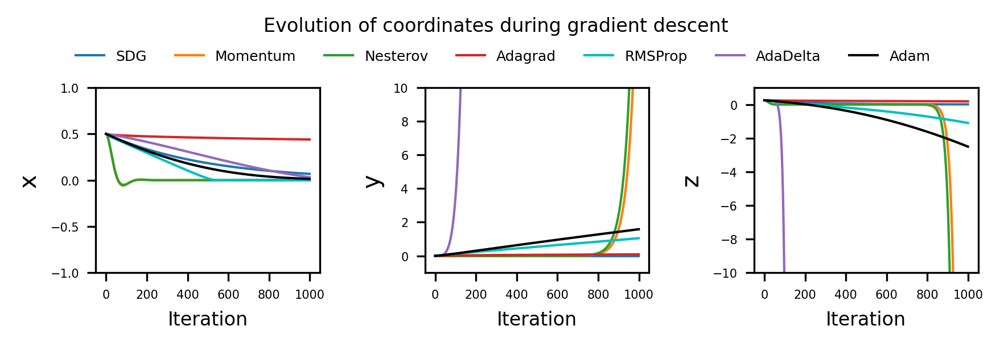

In [35]:
# Define initialization parameters
n_iters = 1000
step_size = 0.001
x_sym, y_sym = .5, 1e-10

data_symmetry = gradient_descent(x_sym, y_sym, step_size ,n_iters)
data_symmetry_Momentum = gradient_descent(x_sym, y_sym, step_size ,n_iters, 0.95)
data_symmetry_Nesterov = NAG(x_sym, y_sym, step_size ,n_iters, 0.95)
data_symmetry_Adagrad = Adagrad(x_sym, y_sym, step_size ,n_iters)
data_symmetry_RMSProp = RMSProp(x_sym, y_sym, step_size ,n_iters, 0.9)
data_symmetry_AdaDelta = AdaDelta(x_sym, y_sym, step_size ,n_iters, 0.9)
data_symmetry_Adam = Adam(x_sym, y_sym, step_size ,n_iters)



fig2, ax2 = plt.subplots(1, 3, figsize = (6, 2), dpi = 300)
plt.rcParams['lines.linewidth'] = 1

ax2[0].plot(data_symmetry[:,0])
ax2[0].plot(data_symmetry_Momentum[:,0])
ax2[0].plot(data_symmetry_Nesterov[:,0])
ax2[0].plot(data_symmetry_Adagrad[:,0])
ax2[0].plot(data_symmetry_RMSProp[:,0], 'c')
ax2[0].plot(data_symmetry_AdaDelta[:,0])
ax2[0].plot(data_symmetry_Adam[:,0], 'k')
ax2[0].set_xlabel('Iteration', fontsize = 8)
ax2[0].set_ylabel('x')
ax2[0].set_ylim(-1, 1)
ax2[0].tick_params(labelsize= 5)

ax2[1].plot(data_symmetry[:,1])
ax2[1].plot(data_symmetry_Momentum[:,1])
ax2[1].plot(data_symmetry_Nesterov[:,1])
ax2[1].plot(data_symmetry_Adagrad[:,1])
ax2[1].plot(data_symmetry_RMSProp[:,1], 'c')
ax2[1].plot(data_symmetry_AdaDelta[:,1])
ax2[1].plot(data_symmetry_Adam[:,1], 'k')
ax2[1].set_xlabel('Iteration', fontsize = 8)
ax2[1].set_ylabel('y')
ax2[1].set_ylim(-1, 10)
ax2[1].tick_params(labelsize= 5)
# ax2[1].set_ylim(-0.5, 1)


ax2[2].plot(data_symmetry[:,2], label = 'SDG')
ax2[2].plot(data_symmetry_Momentum[:,2], label = 'Momentum')
ax2[2].plot(data_symmetry_Nesterov[:,2], label = 'Nesterov')
ax2[2].plot(data_symmetry_Adagrad[:,2], label = 'Adagrad')
ax2[2].plot(data_symmetry_RMSProp[:,2], label = 'RMSProp', color = 'c')
ax2[2].plot(data_symmetry_AdaDelta[:,2], label = 'AdaDelta')
ax2[2].plot(data_symmetry_Adam[:,2], label = 'Adam', color = 'k')
ax2[2].set_xlabel('Iteration', fontsize = 8)
ax2[2].set_ylabel('z')
ax2[2].set_ylim(-10, 1)
ax2[2].tick_params(labelsize= 5)



handles, labels = ax2[2].get_legend_handles_labels()
fig2.legend(handles, labels, loc=(0.07, 0.8), fancybox = False, frameon = False, ncols = 7, fontsize = 6)
fig2.suptitle('Evolution of coordinates during gradient descent', y = 0.99, fontsize =8)

fig2.tight_layout()
fig2.savefig(f'coordinates_results_{step_size}.jpeg', dpi = 300, bbox_inches='tight',)


<ipython-input-36-c5f3d03b10e9>:9: UserWarning: The following kwargs were not used by contour: 'normalize'
  cntr1 = ax.contourf(X, Y, f([X, Y]), levels = 50, alpha = 0.6, cmap = 'coolwarm', normalize = 'linear', vmax = 1, vmin = -2)
<ipython-input-36-c5f3d03b10e9>:10: UserWarning: The following kwargs were not used by contour: 'normalize'
  ax.contour(X, Y, f([X, Y]), levels = 50, linewidths = 1, cmap = 'coolwarm', normalize = 'linear', vmax = 1, vmin = -2)


(-0.5, 0.6)

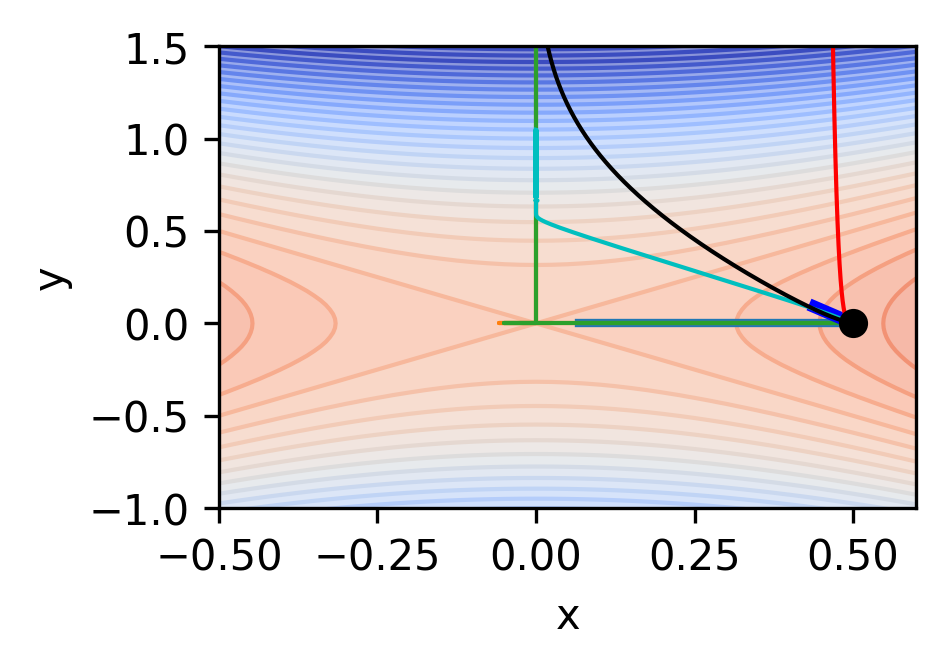

In [36]:
contour_fig, ax = plt.subplots( figsize = (3, 2), dpi = 300)

delta = 0.025
x_contour = np.arange(-1, 1, delta)
y_contour = np.arange(-2,2, delta)
#
X, Y = np.meshgrid(x_contour, y_contour)
levels = np.arange(-5, 5, 0.05)
cntr1 = ax.contourf(X, Y, f([X, Y]), levels = 50, alpha = 0.6, cmap = 'coolwarm', normalize = 'linear', vmax = 1, vmin = -2)
ax.contour(X, Y, f([X, Y]), levels = 50, linewidths = 1, cmap = 'coolwarm', normalize = 'linear', vmax = 1, vmin = -2)

ax.plot(data_symmetry[:,0], data_symmetry[:,1], '-o', markersize = 0.5, linewidth = 2)
ax.plot(data_symmetry_Momentum[:,0], data_symmetry_Momentum[:,1],  linewidth = 1)
ax.plot(data_symmetry_Nesterov[:,0], data_symmetry_Nesterov[:,1], linewidth = 1)
ax.plot(data_symmetry_Adagrad[:,0], data_symmetry_Adagrad[:,1], linewidth = 3, color = 'b')
ax.plot(data_symmetry_RMSProp[:,0], data_symmetry_RMSProp[:,1], linewidth = 1, color = 'c')
ax.plot(data_symmetry_AdaDelta[:,0], data_symmetry_AdaDelta[:,1], linewidth = 1, color = 'r')
ax.plot(data_symmetry_Adam[:,0], data_symmetry_Adam[:,1],  linewidth = 1, color = 'k')
ax.plot(x_sym, y_sym, 'ko')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_ylim([-1, 1.5])
ax.set_xlim([-0.5, .6])



# Plot the trajectories of the optimization on top of the surface

For this to work when using matplotlib, we need to add a second set of axes.
Then, we have to indicate manually the order of the 3D projections on the 2D image using  `set_zorder`.
Finally, we hide the new axes using `set_axis_off`.





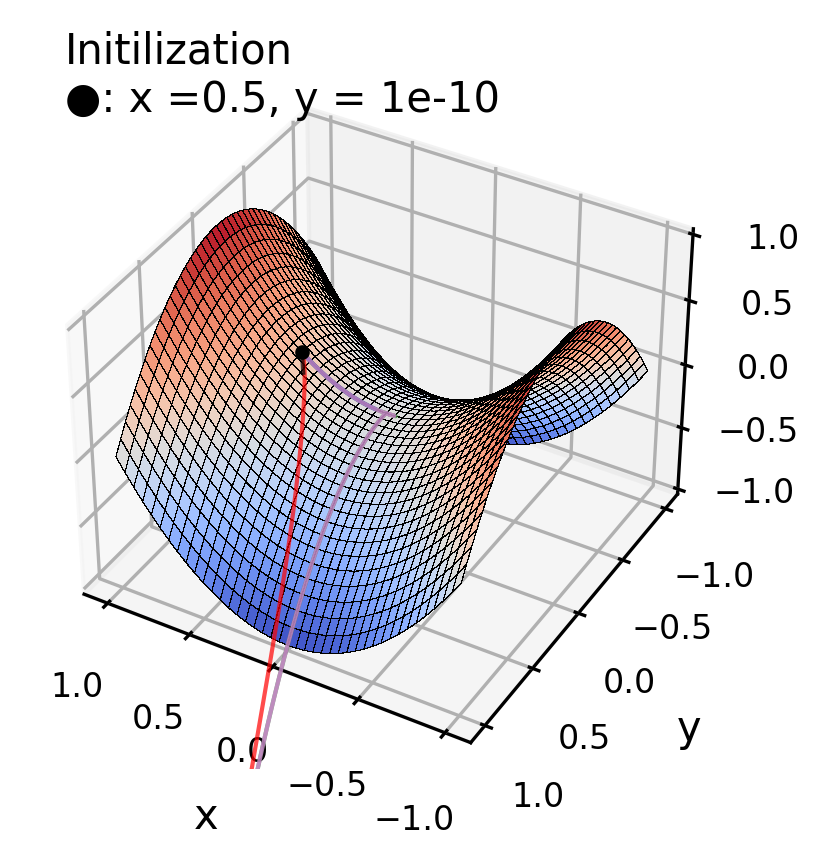

In [37]:
newax = fig1.add_axes(ax1.get_position(), projection='3d',
                     xlim = ax1.get_xlim(),
                     ylim = ax1.get_ylim(),
                     zlim = ax1.get_zlim(),
                     facecolor = 'none',)
newax.view_init(azim= 120, elev= 37)
newax.set_zorder(1)
ax1.set_zorder(0)

newax.plot3D(data_symmetry[:,0], data_symmetry[:, 1],
              data_symmetry[:, 2], c='blue', alpha = 0.7)
newax.plot3D(data_symmetry_Adam[:,0], data_symmetry_Adam[:, 1],
              data_symmetry_Adam[:, 2], c='red', alpha = 0.7)
newax.plot3D(data_symmetry_Momentum[:,0], data_symmetry_Momentum[:, 1],
              data_symmetry_Momentum[:, 2], c='green', alpha = 0.7)
newax.plot3D(data_symmetry_Nesterov[:,0], data_symmetry_Nesterov[:, 1],
              data_symmetry_Nesterov[:, 2], c='violet', alpha = 0.7)
newax.plot3D(data_symmetry_Adagrad[:,0], data_symmetry_Adagrad[:, 1],
              data_symmetry_Adagrad[:, 2], c='black', alpha = 0.7)


newax.plot3D(data_symmetry[0, 0], data_symmetry[0, 1], data_symmetry[0, 2],
               ms = 2.5, c='black', marker='o')
newax.set_axis_off()
sq = u'■'
cir = u'●'
ax1.text2D(0.05, 0.95, f'Initilization\n'\
                      f'{cir}: x ={x_sym}, y = {y_sym}', transform=ax1.transAxes)

# fig1.savefig('gradient_descent_static.jpeg')
fig1

# Create function to animate the figure
We will use matplotlib's [`TimedAnimation`](https://medium.com/r/?url=https%3A%2F%2Fmatplotlib.org%2Fstable%2Fapi%2F_as_gen%2Fmatplotlib.animation.TimedAnimation.html%23matplotlib.animation.TimedAnimation) class to create the animation. Specifically, we use the method [`FUncAnimation`](https://matplotlib.org/stable/api/_as_gen/matplotlib.animation.FuncAnimation.html), which will sequentially update our figure using an update function that we need to define.

Here we define this update function, in this case, called `descent_animation`.

Notice that I included `set_zorder` and `set_axis_off` so they'll be used everytime the function is called .

# Finally, we can create the animation

## Defining animation function




In [38]:
def descent_animation_Advanced(num):
    # Clear the axes where we are plotting the tracjectories
    newax.clear()
    nag_ax.clear()
    mom_ax.clear()

    # Manually adjust the order of the axes

    nag_ax.set_zorder(3)
    mom_ax.set_zorder(2)
    newax.set_zorder(1)
    ax.set_zorder(0)

    # Hide the axes in the front plane
    newax.set_axis_off()
    nag_ax.set_axis_off()
    mom_ax.set_axis_off()

    for label, info in optims.items():
      # Plot new frame of trajectory line
      data = info[0]
      color = info[1]
      posn = info[2]
      if posn == 1:
        newax.plot3D(data[:num+1, 0], data[:num+1, 1], data[:num+1, 2],
                    alpha = 0.8, label = label, color = color)

        # Updating Point Location
        newax.scatter(data[num, 0], data[num, 1], data[num, 2],
                s = 10, marker='o', edgecolor = 'k', linewidth = 0.5,
                      color = color)
      if posn == 2:
        mom_ax.plot3D(data[:num+1, 0], data[:num+1, 1], data[:num+1, 2],
                    alpha = 0.8, label = label, color = color)

        # Updating Point Location
        mom_ax.scatter(data[num, 0], data[num, 1], data[num, 2],
                s = 10, marker='o', edgecolor = 'k', linewidth = 0.5,
                      color = color)

      if posn == 3:
        nag_ax.plot3D(data[:num+1, 0], data[:num+1, 1], data[:num+1, 2],
                    alpha = 0.8, label = label, color = color)

        # Updating Point Location
        nag_ax.scatter(data[num, 0], data[num, 1], data[num, 2],
                s = 10, marker='o', edgecolor = 'k', linewidth = 0.5,
                      color = color)

    # Adding Constant Origin
    newax.plot3D(data_symmetry[0, 0], data_symmetry[0, 1], data_symmetry[0, 2],
               ms = 2.5, c='black', marker='o')


    # Setting Axes Limits and view angles
    newax.set_xlim3d(limx)
    newax.set_ylim3d(limy)
    newax.set_zlim3d(limz)
    newax.view_init(azim= azim, elev= elev)

    mom_ax.set_xlim3d(limx)
    mom_ax.set_ylim3d(limy)
    mom_ax.set_zlim3d(limz)
    mom_ax.view_init(azim= azim, elev= elev)

    nag_ax.set_xlim3d(limx)
    nag_ax.set_ylim3d(limy)
    nag_ax.set_zlim3d(limz)
    nag_ax.view_init(azim= azim, elev= elev)

## Creating the animated figure

I needed to add additional axes to avoid issues with the trajectories of the optimizers overlapping and looking weird.

The dictionary `optims` is used to index which trajectory is plotted in which `axes` object and which color is assigned to it (to ensure consistency for the legend).

At the end, I create 2D line objects to which I assign the labels and colors of the different optimizers.

There are probably better ways to achieve this, but I couldn't figure out (or was too lazy to search more) how to get a global legend across multiple axes.

/usr/local/lib/python3.10/dist-packages/matplotlib/animation.py:884: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


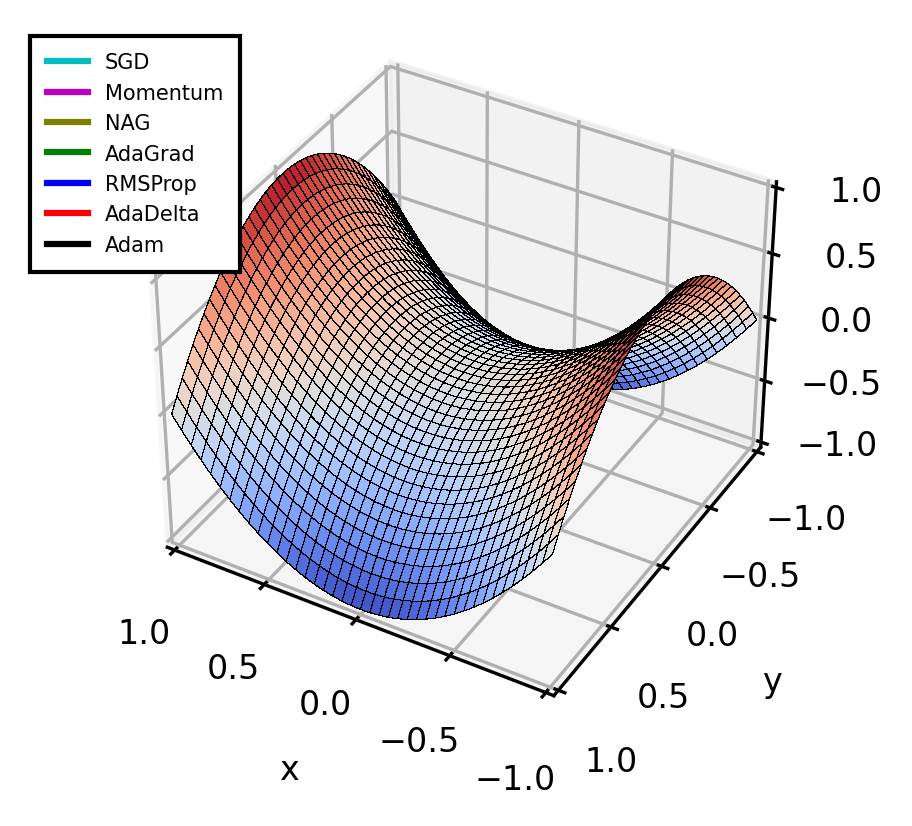

In [39]:
optims = {'SGD' : [data_symmetry, 'c', 1],
            'Momentum': [data_symmetry_Momentum, 'm', 2],
            'NAG': [data_symmetry_Nesterov, 'olive', 3],
            'AdaGrad': [data_symmetry_Adagrad, 'g', 1],
            'RMSProp': [data_symmetry_RMSProp, 'b', 1],
            'AdaDelta': [data_symmetry_AdaDelta, 'r', 1],
            'Adam': [data_symmetry_Adam, 'k', 1]}

# Define global parameters for plotting
plot_args = {'rstride': 2, 'cstride': 2, 'cmap':"coolwarm",
            'linewidth': 0.01, 'antialiased': False,
            'vmin': -1, 'vmax': 1, 'edgecolors':'k'}

# 3D view orientation
azim = 120
elev = 37

# Common axes limits
limx = [-1,1]
limy = [-1,1]
limz = [-1,1]

# Generate grid of points
x, y = np.mgrid[-1:1:81j, -1:1:81j]


# Create figure
fig = plt.figure(figsize = (3.5, 3), dpi = 300)
ax = fig.add_subplot(111, projection='3d')


ax.plot_surface(x, y, f([x,y]), **plot_args)
ax.view_init(azim= azim, elev= elev)
ax.set_xlim3d(limx)
ax.set_ylim3d(limy)
ax.set_zlim3d(limz)

font = 8
ax.set_xlabel('x', fontsize = font)
# ax.set_xticks([-2, -1, 0, 1])
ax.set_ylabel('y', fontsize = font)
ax.set_zlabel('z', fontsize = font)
ax.tick_params(labelsize= font)



# Add new axes to plot the trajectories
newax = fig.add_axes(ax.get_position(), projection='3d',
                    xlim = ax.get_xlim(),
                    ylim = ax.get_ylim(),
                    zlim = ax.get_zlim(),
                    facecolor = 'none',)
newax.view_init(azim= azim, elev= elev)

mom_ax = fig.add_axes(ax.get_position(), projection='3d',
                    xlim = ax.get_xlim(),
                    ylim = ax.get_ylim(),
                    zlim = ax.get_zlim(),
                    facecolor = 'none',)
mom_ax.view_init(azim= azim, elev= elev)

nag_ax = fig.add_axes(ax.get_position(), projection='3d',
                    xlim = ax.get_xlim(),
                    ylim = ax.get_ylim(),
                    zlim = ax.get_zlim(),
                    facecolor = 'none',)
nag_ax.view_init(azim= azim, elev= elev)

nag_ax.set_zorder(3)
mom_ax.set_zorder(2)
newax.set_zorder(1)
ax.set_zorder(0)
newax.set_axis_off()
nag_ax.set_axis_off()
mom_ax.set_axis_off()



# Include legend
custom_lines = [Line2D([0], [0], color = data[1], lw=1.5)   for label, data in optims.items()]
ax.legend(custom_lines, optims.keys(), fancybox = False, fontsize = 5, frameon = True, ncols = 1, loc = (-0.12, 0.65), framealpha = 1, edgecolor = 'k', borderpad = 0.8)


# Plotting the Animation
line_ani_Adv= animation.FuncAnimation(fig, descent_animation_Advanced, interval=1,
                                   frames= n_iters)
plt.show()

# Saving and displaying the results
Gif format does not support more than 100 fps, so making the figures look faster would require having fewer frames. I decided to just post-process the figures using [EZGif](https://ezgif.com/speed) to increase their speed and optimize them for web display.

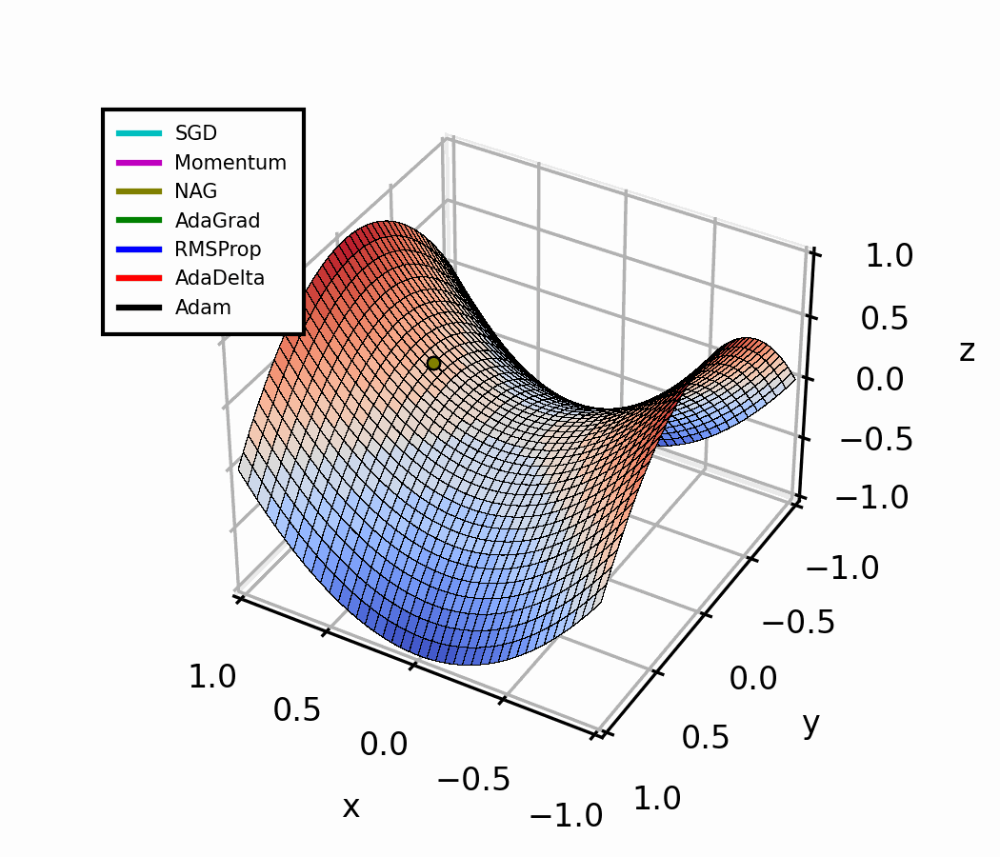

In [40]:
filename = "Advanced_optimizations_Saddle.gif"
writergif = animation.PillowWriter(fps=100)
line_ani_Adv.save(filename, writer=writergif)


# Display the animated figure
Image(open(filename,'rb').read())

# Comparing optimization algorithms for different learning rates


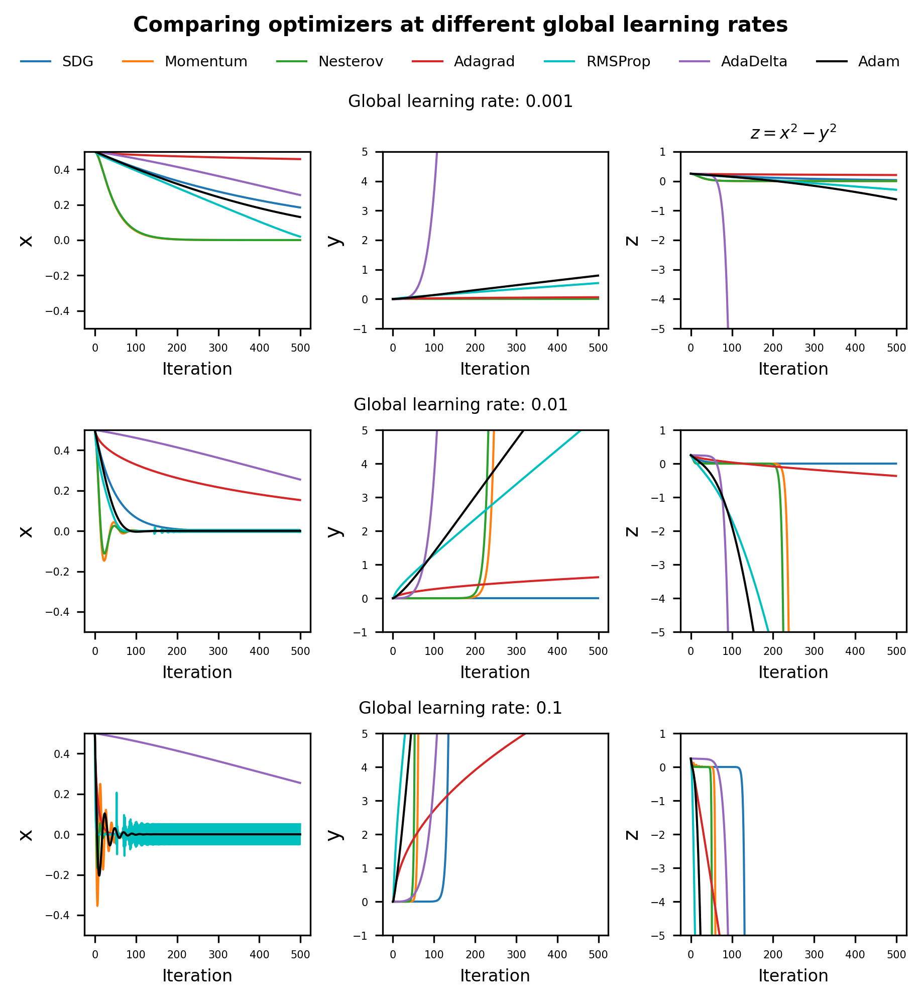

In [41]:
n_iters = 500
step_sizes = [0.001, 0.01, 0.1]

x_init, y_init = .5, 1e-10


fig2, axs = plt.subplots(3, 1, figsize = (6, 6), dpi = 300, constrained_layout=True)
plt.rcParams['lines.linewidth'] = 1


# clear subplots
for ax in axs:
    ax.remove()

# add subfigure per subplot
gridspec = axs[0].get_subplotspec().get_gridspec()
subfigs = [fig2.add_subfigure(gs) for gs in gridspec]


for row, subfig in enumerate(subfigs):
  step_size = step_sizes[row]
  subfig.suptitle(f'Global learning rate: {step_size}', fontsize = 8)

  data_SGD = gradient_descent(x_init, y_init, step_size ,n_iters)
  data_Momentum = gradient_descent(x_init, y_init, step_size ,n_iters, 0.9)
  data_Nesterov = NAG(x_init, y_init, step_size ,n_iters, 0.9)
  data_Adagrad = Adagrad(x_init, y_init, step_size ,n_iters)
  data_RMSProp = RMSProp(x_init, y_init, step_size ,n_iters, 0.9)
  data_AdaDelta = AdaDelta(x_init, y_init, step_size ,n_iters, 0.9)
  data_Adam = Adam(x_init, y_init, step_size ,n_iters)


  # create 1x3 subplots per subfig
  axs = subfig.subplots(nrows=1, ncols=3,)

  axs[0].plot(data_SGD[:,0])
  axs[0].plot(data_Momentum[:,0])
  axs[0].plot(data_Nesterov[:,0])
  axs[0].plot(data_Adagrad[:,0])
  axs[0].plot(data_RMSProp[:,0], 'c')
  axs[0].plot(data_AdaDelta[:,0])
  axs[0].plot(data_Adam[:,0], 'k')
  axs[0].set_xlabel('Iteration', fontsize = 8)
  axs[0].set_ylabel('x')
  axs[0].set_ylim(-0.5, 0.5)
  axs[0].tick_params(labelsize= 5)

  axs[1].plot(data_SGD[:,1])
  axs[1].plot(data_Momentum[:,1])
  axs[1].plot(data_Nesterov[:,1])
  axs[1].plot(data_Adagrad[:,1])
  axs[1].plot(data_RMSProp[:,1], 'c')
  axs[1].plot(data_AdaDelta[:,1])
  axs[1].plot(data_Adam[:,1], 'k')
  axs[1].set_xlabel('Iteration', fontsize = 8)
  axs[1].set_ylabel('y')
  axs[1].set_ylim(-1, 5)
  axs[1].tick_params(labelsize= 5)

  axs[2].plot(data_SGD[:,2], label = 'SDG')
  axs[2].plot(data_Momentum[:,2], label = 'Momentum')
  axs[2].plot(data_Nesterov[:,2], label = 'Nesterov')
  axs[2].plot(data_Adagrad[:,2], label = 'Adagrad')
  axs[2].plot(data_RMSProp[:,2], label = 'RMSProp', color = 'c')
  axs[2].plot(data_AdaDelta[:,2], label = 'AdaDelta')
  axs[2].plot(data_Adam[:,2], label = 'Adam', color = 'k')
  axs[2].set_xlabel('Iteration', fontsize = 8)
  axs[2].set_ylabel('z')
  axs[2].set_ylim(-5, 1)
  axs[2].tick_params(labelsize= 5)
  if row == 0:
    axs[2].set_title('$z = x^2 - y^2$',fontsize = 8)
  if row == 2:
    handles, labels = axs[2].get_legend_handles_labels()


fig2.suptitle('Comparing optimizers at different global learning rates', fontsize =10, fontweight = 'bold', y = 1.08)
leg = fig2.legend(handles, labels, loc='upper center', fancybox = False, frameon = False, ncols = 7, fontsize = 7,  bbox_to_anchor=(0.5, 1.05))

fig2.savefig('coordinates_results_Iters.jpeg', dpi = 300, bbox_inches='tight',pad_inches = 0.3)